In [ ]:
@author AlicjaTerelak

In [60]:
import nilearn
from nilearn import datasets
from nilearn import input_data
import matplotlib.pyplot as plt
from nilearn.connectome import ConnectivityMeasure
from nilearn import plotting
import numpy as np
from matplotlib.pyplot import cm

In [62]:
dataset = datasets.fetch_development_fmri(n_subjects=10)

# print basic information on the dataset
print('First subject functional nifti image (4D) is at: %s' %
      dataset.func[0])  # 4D data

First subject functional nifti image (4D) is at: C:\Users\DOM/nilearn_data\development_fmri\development_fmri\sub-pixar123_task-pixar_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


## Coordinates of Face Network

In [63]:
fn_coords = [(-38, -58, -14), (40, -55, -12), (-50, -48, 15), (50, -47, 13), (-41, -81, -4), (39, -79, -6)]
fn_labels = [
    'Fusiform Face Area (left)',
    'Fusiform Face Area (right)',
    'Superior Temporal Sulcus (left)',
    'Superior Temporal Sulcus (right)',
    'Occipital Face Area (left)',
    'Occipital Face Area (right)'
    ]

right_fn_coords = [(40, -55, -12), (50, -47, 13), (39, -79, -6)]
right_fn_labels = [
    'Fusiform Face Area (right)',
    'Superior Temporal Sulcus (right)',
    'Occipital Face Area (right)'
]

left_fn_coords = [(-38, -58, -14), (-50, -48, 15), (-41, -81, -4)]
left_fn_labels = [
    'Fusiform Face Area (left)',
    'Superior Temporal Sulcus (left)',
    'Occipital Face Area (left)'
]

## Extracts signal from sphere around FN seeds
### Left and right

In [64]:
fn_masker = input_data.NiftiSpheresMasker(
    fn_coords, radius=8,
    detrend=True, standardize=True,
    low_pass=0.1, high_pass=0.01, t_r=2,
    memory='nilearn_cache', memory_level=1, verbose=2)

# Additionally, we pass confound information to ensure our extracted
# signal is cleaned from confounds.

func_filename = dataset.func[0]
confounds_filename = dataset.confounds[0]

fn_time_series = fn_masker.fit_transform(func_filename,
                                   confounds=[confounds_filename])

[Memory]0.0s, 0.0min    : Loading filter_and_extract...


### Right

In [65]:
right_masker = input_data.NiftiSpheresMasker(
    right_fn_coords, radius=8,
    detrend=True, standardize=True,
    low_pass=0.1, high_pass=0.01, t_r=2,
    memory='nilearn_cache', memory_level=1, verbose=2)

# Additionally, we pass confound information to ensure our extracted
# signal is cleaned from confounds.

func_filename = dataset.func[0]
confounds_filename = dataset.confounds[0]

fn_right_time_series = right_masker.fit_transform(func_filename,
                                   confounds=[confounds_filename])

[Memory]0.0s, 0.0min    : Loading filter_and_extract...


### Left

In [66]:
left_masker = input_data.NiftiSpheresMasker(
    left_fn_coords, radius=8,
    detrend=True, standardize=True,
    low_pass=0.1, high_pass=0.01, t_r=2,
    memory='nilearn_cache', memory_level=1, verbose=2)

# Additionally, we pass confound information to ensure our extracted
# signal is cleaned from confounds.

func_filename = dataset.func[0]
confounds_filename = dataset.confounds[0]

fn_left_time_series = left_masker.fit_transform(func_filename,
                                   confounds=[confounds_filename])

[Memory]0.0s, 0.0min    : Loading filter_and_extract...


## Display time series
### Left and right

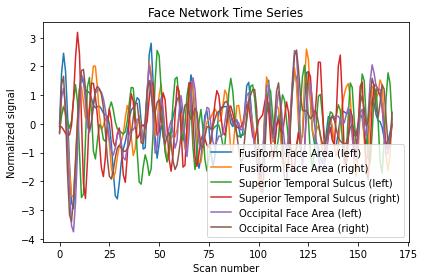

In [72]:
for time_serie, label in zip(fn_time_series.T, fn_labels):
    plt.plot(time_serie, label=label)
    

plt.title('Face Network Time Series')
plt.xlabel('Scan number')
plt.ylabel('Normalized signal')
plt.legend()
plt.tight_layout()
plt.savefig('fn-timeseries.jpg')

### Right

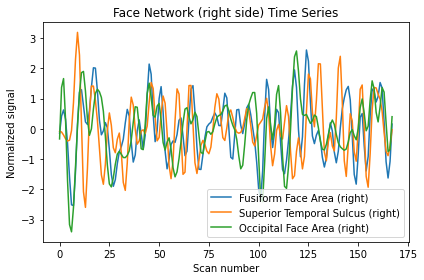

In [75]:
for time_serie, label in zip(fn_right_time_series.T, right_fn_labels):
    plt.plot(time_serie, label=label)

plt.title('Face Network (right side) Time Series')
plt.xlabel('Scan number')
plt.ylabel('Normalized signal')
plt.legend()
plt.tight_layout()
plt.savefig('right-fn-timeseries.pdf')

### Left

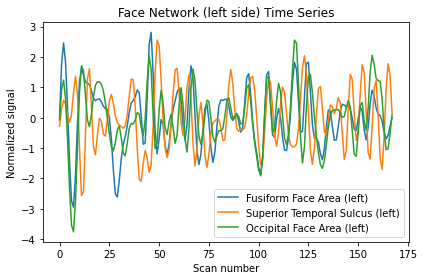

In [78]:
for time_serie, label in zip(fn_left_time_series.T, left_fn_labels):
    plt.plot(time_serie, label=label)

plt.title('Face Network (left side) Time Series')
plt.xlabel('Scan number')
plt.ylabel('Normalized signal')
plt.legend()
plt.tight_layout()
plt.savefig('left-fn-timeseries.pdf')

## Compute partial correlation matrix 
### Left and right

In [79]:
fn_connectivity_measure = ConnectivityMeasure(kind='partial correlation')
fn_partial_correlation_matrix = fn_connectivity_measure.fit_transform(
    [fn_time_series])[0]

### Right

In [80]:
right_fn_connectivity_measure = ConnectivityMeasure(kind='partial correlation')
right_fn_partial_correlation_matrix = right_fn_connectivity_measure.fit_transform(
    [fn_right_time_series])[0]

### Left

In [81]:
left_fn_connectivity_measure = ConnectivityMeasure(kind='partial correlation')
left_fn_partial_correlation_matrix = left_fn_connectivity_measure.fit_transform(
    [fn_left_time_series])[0]

## Display connectome
### Left and right

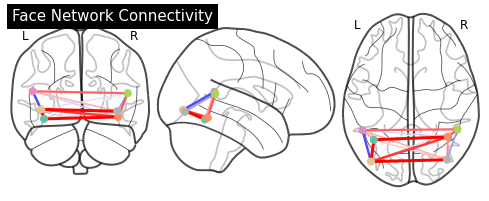

In [84]:
fn_conn = plotting.plot_connectome(fn_partial_correlation_matrix, fn_coords,
                         title="Face Network Connectivity")

fn_conn.savefig('fn-connectivity.jpg')

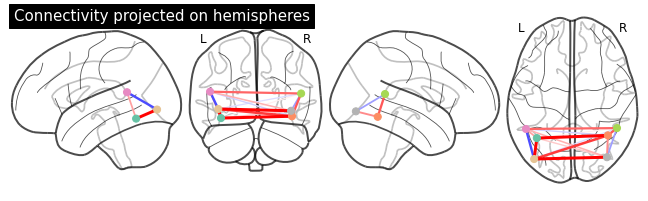

In [87]:
fn_hemisphere = plotting.plot_connectome(fn_partial_correlation_matrix, fn_coords,
                         title="Connectivity projected on hemispheres",
                         display_mode='lyrz')

plotting.show()

fn_hemisphere.savefig('fn-hemisphere.jpg')

### Right

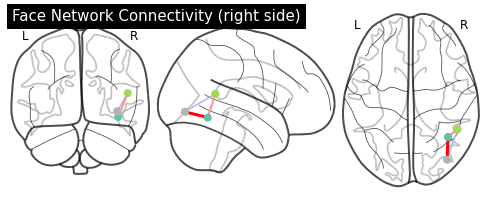

In [23]:
plotting.plot_connectome(right_fn_partial_correlation_matrix, right_fn_coords,
                         title="Face Network Connectivity (right side)")

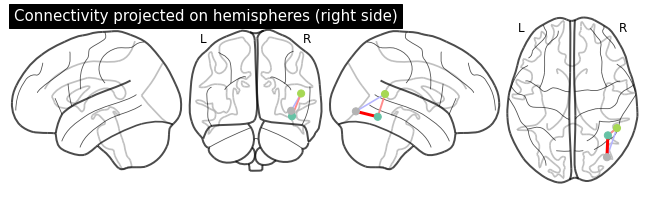

In [25]:
plotting.plot_connectome(right_fn_partial_correlation_matrix, right_fn_coords,
                         title="Connectivity projected on hemispheres (right side)",
                         display_mode='lyrz')

plotting.show()

### Left

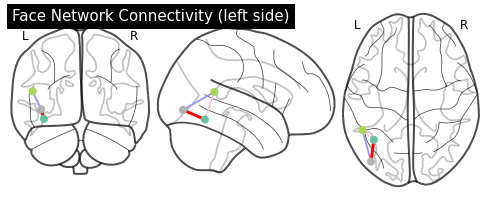

In [26]:
plotting.plot_connectome(left_fn_partial_correlation_matrix, left_fn_coords,
                         title="Face Network Connectivity (left side)")

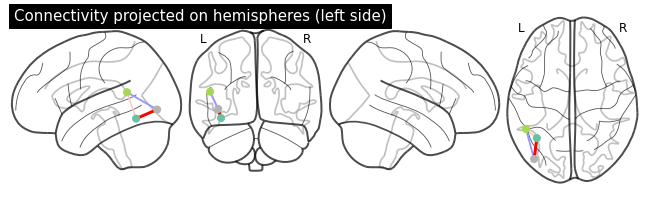

In [27]:
plotting.plot_connectome(left_fn_partial_correlation_matrix, left_fn_coords,
                         title="Connectivity projected on hemispheres (left side)",
                         display_mode='lyrz')

plotting.show()

## 3D visualization in a web browser
### Left and right

In [28]:
view = plotting.view_connectome(fn_partial_correlation_matrix, fn_coords)

# In a Jupyter notebook, if ``view`` is the output of a cell, it will
# be displayed below the cell
view

### Right

In [29]:
view = plotting.view_connectome(right_fn_partial_correlation_matrix, right_fn_coords)

view

### Left

In [30]:
view = plotting.view_connectome(left_fn_partial_correlation_matrix, left_fn_coords)

view

## Extract signals on spheres from an atlas

In [41]:
fn_power = datasets.fetch_coords_power_2011()
print('Power atlas comes with {0}.'.format(fn_power.keys()))

Power atlas comes with dict_keys(['rois', 'description']).


## Compute within spheres averaged time-series

In [42]:
fn_coords = np.vstack((fn_power.rois['x'], fn_power.rois['y'], fn_power.rois['z'])).T

print('Stacked power coordinates in array of shape {0}.'.format(fn_coords.shape))

Stacked power coordinates in array of shape (264, 3).


In [43]:
spheres_masker = input_data.NiftiSpheresMasker(
    seeds=fn_coords, smoothing_fwhm=6, radius=5.,
    detrend=True, standardize=True, low_pass=0.1, high_pass=0.01, t_r=2)

timeseries = spheres_masker.fit_transform(func_filename,
                                          confounds=confounds_filename)

## Estimate correlations

In [44]:
print('Time series has {0} samples'.format(timeseries.shape[0]))

Time series has 168 samples


In [45]:
try:
    from sklearn.covariance import GraphicalLassoCV
except ImportError:
    # for Scitkit-Learn < v0.20.0
    from sklearn.covariance import GraphLassoCV as GraphicalLassoCV
    
covariance_estimator = GraphicalLassoCV(cv=3, verbose=1)

In [46]:
covariance_estimator.fit(timeseries)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\DOM\anaconda3\lib\site-packages\sklearn\covariance\_graph_lasso.py:240: RuntimeWarning: invalid value encountered in multiply
  precision_[indices != idx, idx] = (- precision_[idx, idx]
C:\Users\DOM\anaconda3\lib\site-packages\sklearn\covariance\_graph_lasso.py:242: RuntimeWarning: invalid value encountered in multiply
  precision_[idx, indices != idx] = (- precision_[idx, idx]
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[GraphicalLassoCV] Done refinement  1 out of 4:   1s


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[GraphicalLassoCV] Done refinement  2 out of 4:   6s


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    6.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[GraphicalLassoCV] Done refinement  3 out of 4:  13s


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    7.7s finished


[GraphicalLassoCV] Done refinement  4 out of 4:  21s


GraphicalLassoCV(cv=3, verbose=1)

In [37]:
matrix = covariance_estimator.covariance_
print('Covariance matrix has shape {0}.'.format(matrix.shape))

Covariance matrix has shape (264, 264).


## Plot matrix, graph, and strength

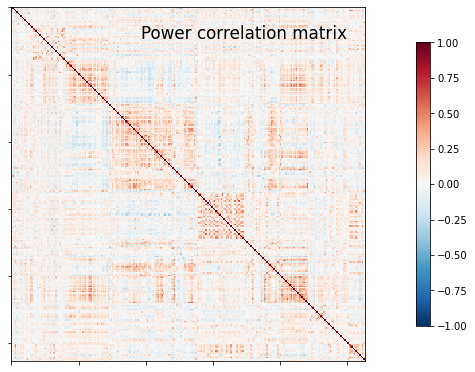

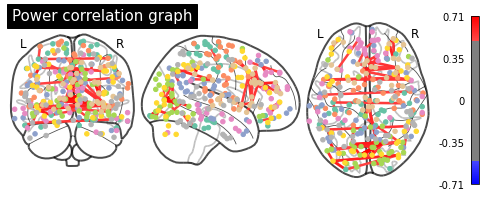

In [47]:
plotting.plot_matrix(matrix, vmin=-1., vmax=1., colorbar=True,
                     title='Power correlation matrix')

# Tweak edge threshold to keep only the strongest connections
plotting.plot_connectome(matrix, fn_coords, title='Power correlation graph',
                         edge_threshold='99.8%', node_size=20, colorbar=True)

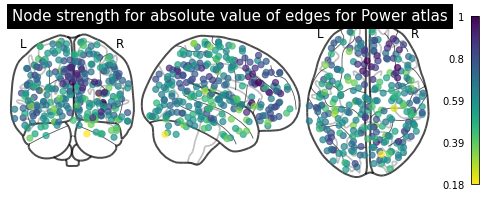

In [48]:
# calculate normalized, absolute strength for each node
node_strength = np.sum(np.abs(matrix), axis=0)
node_strength /= np.max(node_strength)

plotting.plot_markers(
    node_strength,
    fn_coords,
    title='Node strength for absolute value of edges for Power atlas',
)

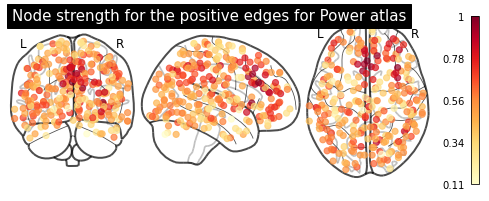

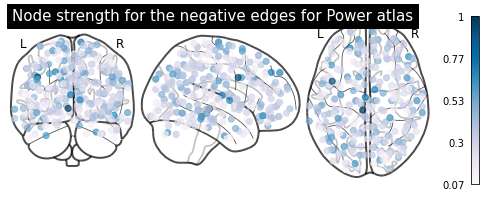

In [50]:
# clip connectivity matrix to preserve positive and negative edges
positive_edges = np.clip(matrix, 0, matrix.max())
negative_edges = np.clip(matrix, matrix.min(), 0)

# calculate strength for positive edges
node_strength_positive = np.sum(np.abs(positive_edges), axis=0)
node_strength_positive /= np.max(node_strength_positive)

# calculate strength for negative edges
node_strength_negative = np.sum(np.abs(negative_edges), axis=0)
node_strength_negative /= np.max(node_strength_negative)

# plot nodes' strength for positive edges
plotting.plot_markers(
    node_strength_positive,
    fn_coords,
    title='Node strength for the positive edges for Power atlas',
    node_cmap=cm.YlOrRd
)

# plot nodes' strength for negative edges
plotting.plot_markers(
    node_strength_negative,
    fn_coords,
    title='Node strength for the negative edges for Power atlas',
    node_cmap=cm.PuBu
)

## Connectome extracted from Dosenbach’s atlas

C:\Users\DOM\anaconda3\lib\site-packages\numpy\lib\npyio.py:2372: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  output = genfromtxt(fname, **kwargs)


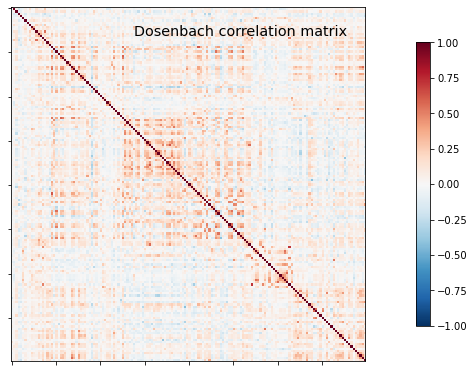

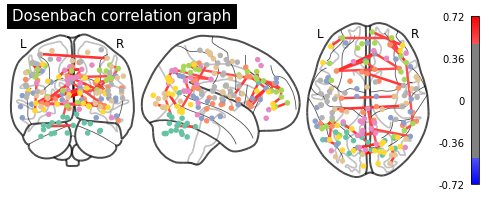

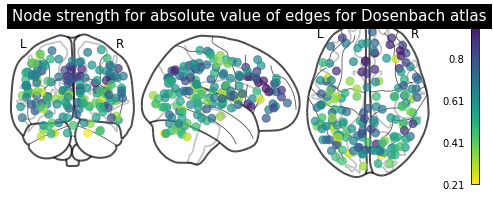

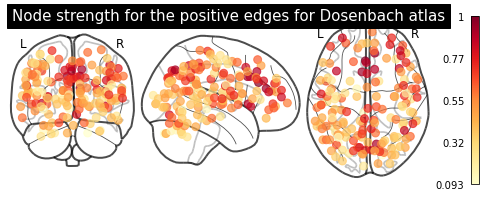

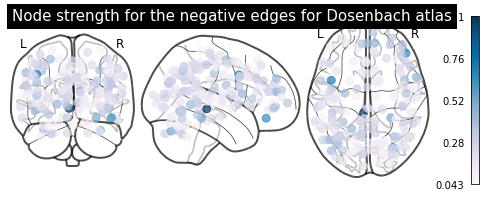

In [51]:
dosenbach = datasets.fetch_coords_dosenbach_2010()

coords = np.vstack((
    dosenbach.rois['x'],
    dosenbach.rois['y'],
    dosenbach.rois['z'],
)).T

spheres_masker = input_data.NiftiSpheresMasker(
    seeds=coords, smoothing_fwhm=6, radius=4.5,
    detrend=True, standardize=True, low_pass=0.1, high_pass=0.01, t_r=2)

timeseries = spheres_masker.fit_transform(func_filename,
                                          confounds=confounds_filename)

covariance_estimator = GraphicalLassoCV()
covariance_estimator.fit(timeseries)
matrix = covariance_estimator.covariance_

plotting.plot_matrix(matrix, vmin=-1., vmax=1., colorbar=True,
                     title='Dosenbach correlation matrix')

plotting.plot_connectome(matrix, coords, title='Dosenbach correlation graph',
                         edge_threshold="99.7%", node_size=20, colorbar=True)


# calculate average strength for each node
node_strength = np.sum(np.abs(matrix), axis=0)
node_strength /= np.max(node_strength)

plotting.plot_markers(
    node_strength,
    coords,
    title='Node strength for absolute value of edges for Dosenbach atlas',
)

# clip connectivity matrix to preserve positive and negative edges
positive_edges = np.clip(matrix, 0, matrix.max())
negative_edges = np.clip(matrix, matrix.min(), 0)

# calculate strength for positive and edges
node_strength_positive = np.sum(np.abs(positive_edges), axis=0)
node_strength_positive /= np.max(node_strength_positive)
node_strength_negative = np.sum(np.abs(negative_edges), axis=0)
node_strength_negative /= np.max(node_strength_negative)

# plot nodes' strength for positive edges
plotting.plot_markers(
    node_strength_positive,
    coords,
    title='Node strength for the positive edges for Dosenbach atlas',
    node_cmap=cm.YlOrRd
)

# plot nodes' strength for negative edges
plotting.plot_markers(
    node_strength_negative,
    coords,
    title='Node strength for the negative edges for Dosenbach atlas',
    node_cmap=cm.PuBu
)

## Connectome extracted from Dosenbach’s atlas - Face Network

C:\Users\DOM\anaconda3\lib\site-packages\numpy\lib\npyio.py:2372: VisibleDeprecationWarning: Reading unicode strings without specifying the encoding argument is deprecated. Set the encoding, use None for the system default.
  output = genfromtxt(fname, **kwargs)


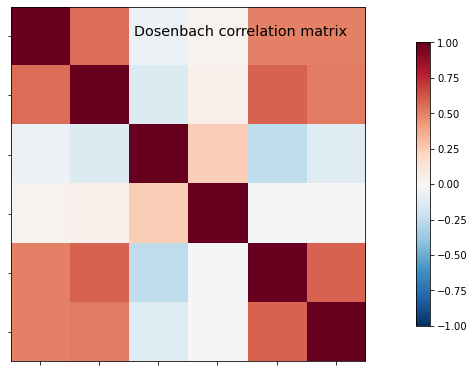

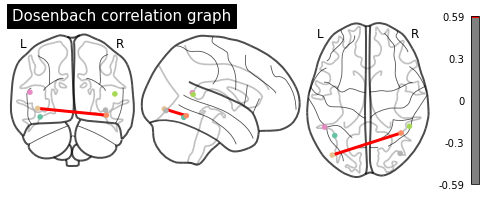

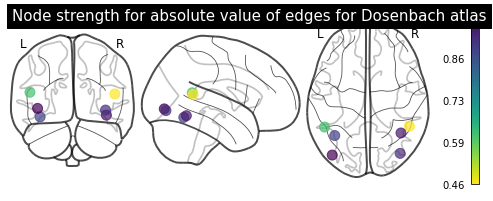

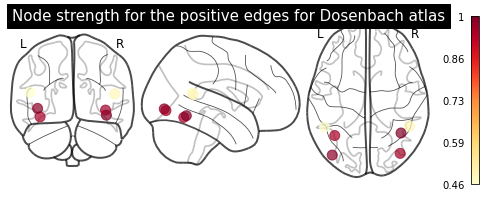

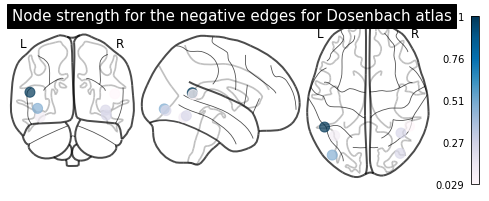

In [58]:
dosenbach = datasets.fetch_coords_dosenbach_2010()

coords = [(-38, -58, -14), (40, -55, -12), (-50, -48, 15), (50, -47, 13), (-41, -81, -4), (39, -79, -6)]

spheres_masker = input_data.NiftiSpheresMasker(
    seeds=coords, smoothing_fwhm=6, radius=4.5,
    detrend=True, standardize=True, low_pass=0.1, high_pass=0.01, t_r=2)

timeseries = spheres_masker.fit_transform(func_filename,
                                          confounds=confounds_filename)

covariance_estimator = GraphicalLassoCV()
covariance_estimator.fit(timeseries)
matrix = covariance_estimator.covariance_

plotting.plot_matrix(matrix, vmin=-1., vmax=1., colorbar=True,
                     title='Dosenbach correlation matrix')

plotting.plot_connectome(matrix, coords, title='Dosenbach correlation graph',
                         edge_threshold="99.7%", node_size=20, colorbar=True)


# calculate average strength for each node
node_strength = np.sum(np.abs(matrix), axis=0)
node_strength /= np.max(node_strength)

dosenbach_edge = plotting.plot_markers(
                node_strength,
                coords,
                title='Node strength for absolute value of edges for Dosenbach atlas',
)


dosenbach_edge.savefig('face-network-dosenbach.pdf')

# clip connectivity matrix to preserve positive and negative edges
positive_edges = np.clip(matrix, 0, matrix.max())
negative_edges = np.clip(matrix, matrix.min(), 0)


# calculate strength for positive and edges
node_strength_positive = np.sum(np.abs(positive_edges), axis=0)
node_strength_positive /= np.max(node_strength_positive)
node_strength_negative = np.sum(np.abs(negative_edges), axis=0)
node_strength_negative /= np.max(node_strength_negative)

# plot nodes' strength for positive edges
plotting.plot_markers(
    node_strength_positive,
    coords,
    title='Node strength for the positive edges for Dosenbach atlas',
    node_cmap=cm.YlOrRd
)

# plot nodes' strength for negative edges
plotting.plot_markers(
    node_strength_negative,
    coords,
    title='Node strength for the negative edges for Dosenbach atlas',
    node_cmap=cm.PuBu
)

In [53]:
print('Dosenbach networks names are {0}'.format(np.unique(dosenbach.networks)))

plotting.show()

Dosenbach networks names are [b'cerebellum' b'cingulo-opercular' b'default' b'fronto-parietal'
 b'occipital' b'sensorimotor']
